In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input

# models
from keras.applications.vgg16 import VGG16
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

In [ ]:
path = r"/content/drive/MyDrive/CV/CV_Project/flower_images"

flowers = []

with os.scandir(path) as files:
  for file in files:
    if file.name.endswith('.png'):
      flowers.append(file.path)

print(flowers[:10])

['/content/drive/MyDrive/CV/CV_Project/flower_images/0113.png', '/content/drive/MyDrive/CV/CV_Project/flower_images/0099.png', '/content/drive/MyDrive/CV/CV_Project/flower_images/0070.png', '/content/drive/MyDrive/CV/CV_Project/flower_images/0064.png', '/content/drive/MyDrive/CV/CV_Project/flower_images/0058.png', '/content/drive/MyDrive/CV/CV_Project/flower_images/0110.png', '/content/drive/MyDrive/CV/CV_Project/flower_images/0138.png', '/content/drive/MyDrive/CV/CV_Project/flower_images/0104.png', '/content/drive/MyDrive/CV/CV_Project/flower_images/0139.png', '/content/drive/MyDrive/CV/CV_Project/flower_images/0111.png']


In [ ]:
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

In [ ]:
def extract_features(file, model):
  img = load_img(file, target_size=(224,224))
  img = np.array(img)
  reshaped_img = img.reshape(1,224,224,3)
  imgx = preprocess_input(reshaped_img)
  features = model.predict(imgx, use_multiprocessing = True)
  return features

In [ ]:
data = {}

p = r"/content/drive/MyDrive/CV/CV_Project/flower_image_features/flower_features.pkl"

for flower in flowers:
  try:
    feat = extract_features(flower, model)
    data[flower] = feat
  except:
    with open(p, 'wb') as file:
      pickle.dump(data, file)

1/1 [==============================] - 1s 620ms/step


In [ ]:
filenames = np.array(list(data.keys()))

feat = np.array(list(data.values()))

feat = feat.reshape(-1, 4096)
feat.shape

(210, 4096)

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/CV/CV_Project/flower_labels.csv')
label = df['label'].tolist()
unique_labels = list(set(label))

In [ ]:
pca = PCA(n_components = 100, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [ ]:
kmeans = KMeans(n_clusters=len(unique_labels), n_init='auto', random_state=22)
kmeans.fit(x)

KMeans(n_clusters=10, n_init='auto', random_state=22)

In [ ]:
groups = {}
for file, cluster in zip(filenames, kmeans.labels_):
  if cluster not in groups.keys():
    groups[cluster] = []
    groups[cluster].append(file)
  else:
    groups[cluster].append(file)

In [ ]:
def view_cluster(cluster):
    plt.figure(figsize = (25,25));
    files = groups[cluster]
    if len(files) > 30:
        print(f"Clipping cluster size from {len(files)} to 30")
        files = files[:29]
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

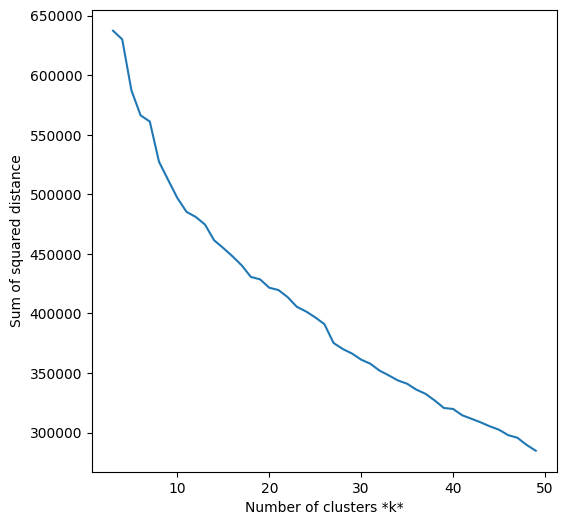

In [ ]:
sse = []
list_k = list(range(3, 50))

for k in list_k:
    km = KMeans(n_clusters=k, n_init='auto', random_state=22,)
    km.fit(x)

    sse.append(km.inertia_)

# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse)
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance');

Clipping cluster size from 32 to 30
Clipping cluster size from 35 to 30
Clipping cluster size from 34 to 30


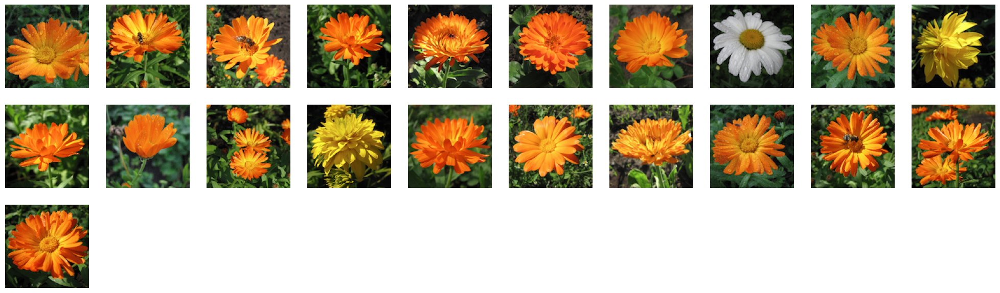

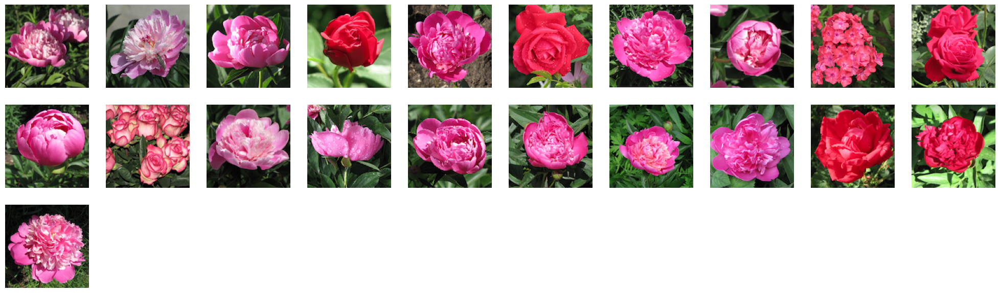

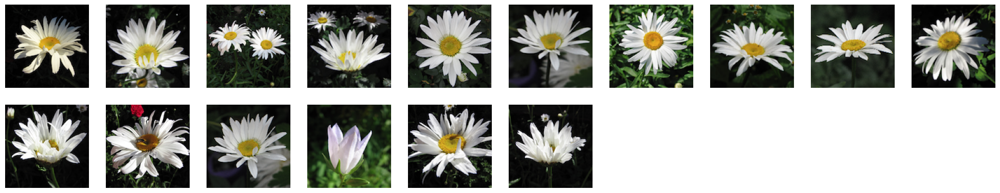

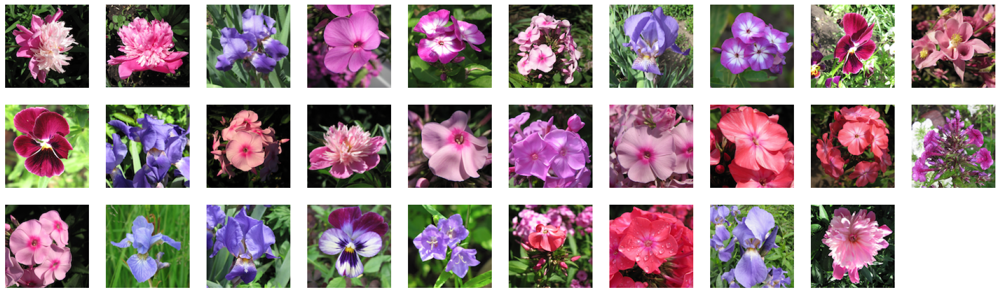

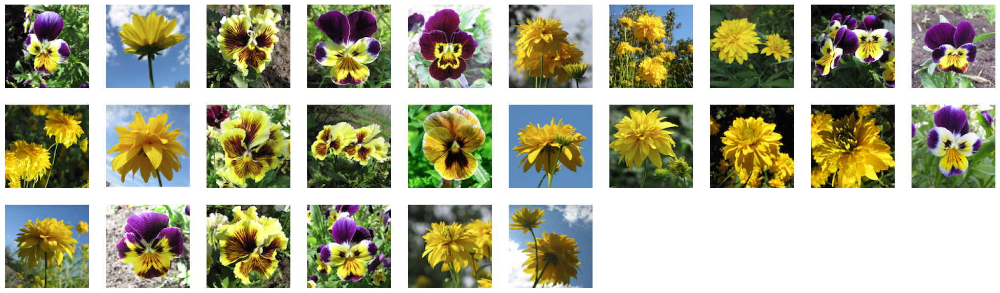

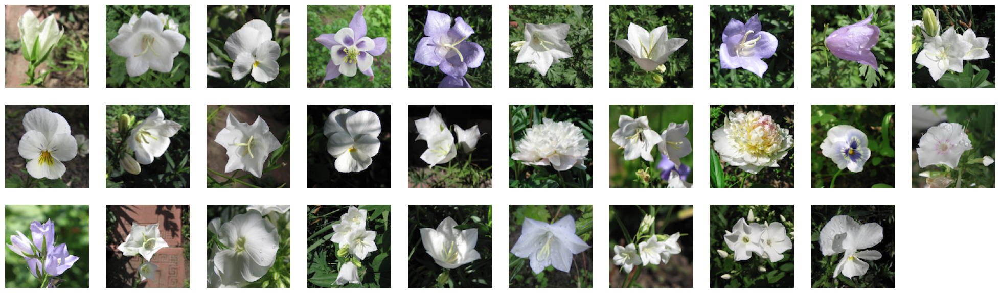

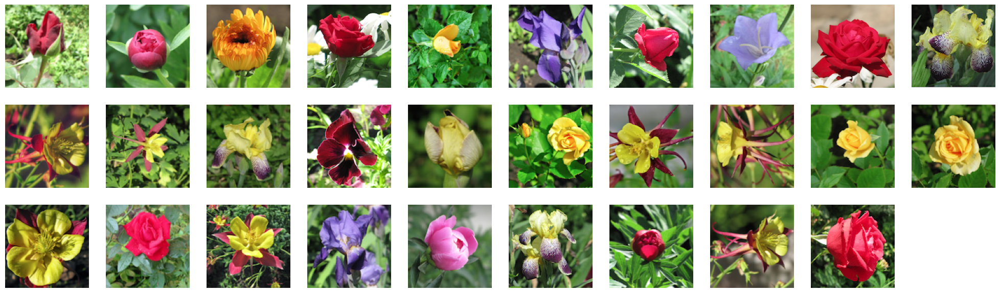

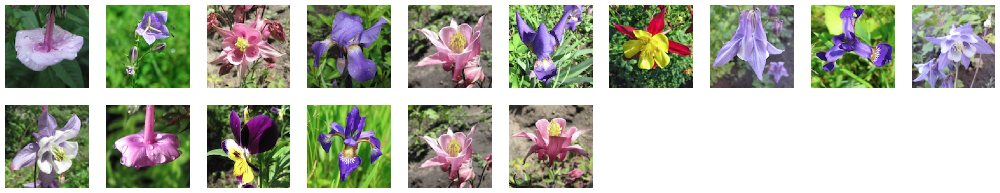

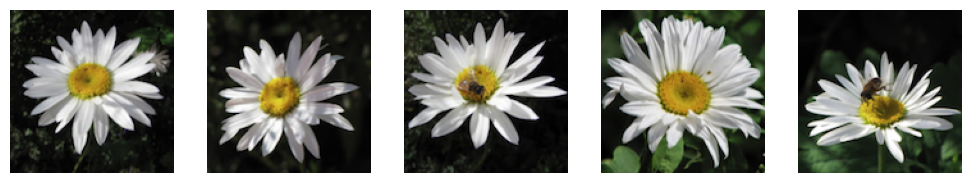

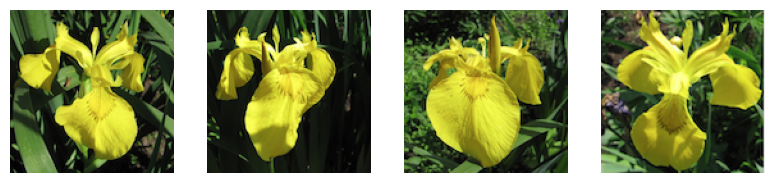

In [ ]:
for key, value in groups.items():
  view_cluster(key)

# Trying to Reproduce for MNIST Dataset

In [ ]:
from keras.datasets import mnist

(x_train, y_train),(x_test,y_test) = mnist.load_data()

In [ ]:
xtrain = np.dstack([x_train] * 3)
xtest = np.dstack([x_test] * 3)
xtrain.shape,xtest.shape

((60000, 28, 84), (10000, 28, 84))

In [ ]:
xtrain = xtrain.reshape(-1, 28,28,3)
xtest = xtest.reshape(-1,28,28,3)
xtrain.shape, xtest.shape

((60000, 28, 28, 3), (10000, 28, 28, 3))

In [ ]:
model = VGG16()
mnist_model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

In [ ]:
from keras.preprocessing.image import img_to_array, array_to_img

def extract_features(img, model):
  resized_img = img_to_array(array_to_img(img, scale=False).resize((224,224)))
  reshaped_img = resized_img.reshape(1,224,224,3)
  imgx = preprocess_input(reshaped_img)
  features = model.predict(imgx, use_multiprocessing = True)
  return features

In [ ]:
data = {}

p = r"/content/drive/MyDrive/CV/CV_Project/mnist_features.pkl"

for idx,img in enumerate(xtest):
  try:
    feat = extract_features(img, mnist_model)
    data[idx] = feat
  except:
    with open(p, 'wb') as file:
      pickle.dump(data, file)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 1s 590ms/step


In [ ]:
image_files = np.array(list(data.keys()))

feat = np.array(list(data.values()))

feat = feat.reshape(-1, 4096)
feat.shape

(10, 4096)

In [ ]:
pca = PCA(n_components = 100, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [ ]:
kmeans = KMeans(n_clusters=10, n_init='auto', random_state=22)
kmeans.fit(x)

In [ ]:
groups = {}
for idx, cluster in zip(image_files, kmeans.labels_):
  if cluster not in groups.keys():
    groups[cluster] = []
    groups[cluster].append(idx)
  else:
    groups[cluster].append(idx)

In [ ]:
def view_cluster(cluster):
    plt.figure(figsize = (25,25));
    file_indices = groups[cluster]
    if len(file_indices) > 30:
        print(f"Clipping cluster size from {len(file_indices)} to 30")
        file_indices = file_indices[:29]
    for index, file_idx in enumerate(file_indices):
        plt.subplot(10,10,index+1);
        plt.imshow(xtest[file_idx])
        plt.axis('off')